# Data 분석

In [1]:
import os
import json
import numpy as np
import pandas as pd

from collections import defaultdict

import matplotlib.pyplot as plt
import seaborn as sns

import albumentations as A
from albumentations.pytorch import ToTensorV2

from dataset import *
from utils import print_image, compare_augmenation

In [2]:
data_dir = '/opt/ml/input/data'
data_file_name = 'train.json'

In [3]:
# Read annotations
anns_file_path = os.path.join(data_dir, data_file_name)
with open(anns_file_path, 'r') as f:
    dataset = json.loads(f.read())

dataset.keys()

dict_keys(['info', 'licenses', 'images', 'categories', 'annotations'])

In [4]:
annotations = dataset['annotations']
images = dataset['images']

print('annotations type', type(annotations))
print('annotations len images', len(images))
print('annotations len annotations', len(annotations), '\n')

idx = 1
print('annotations[idx]', type(annotations[idx]))
print('annotations[idx] keys', annotations[idx].keys())
print('annotations[idx] area', annotations[idx]['area'])
print('annotations[idx] bbox', annotations[idx]['bbox'])

annotations type <class 'list'>
annotations len images 2617
annotations len annotations 21116 

annotations[idx] <class 'dict'>
annotations[idx] keys dict_keys(['id', 'image_id', 'category_id', 'segmentation', 'area', 'bbox', 'iscrowd'])
annotations[idx] area 1623.0
annotations[idx] bbox [331.9, 193.4, 64.8, 48.4]


## Image 확인

In [5]:
data_path = os.path.join(data_dir, data_file_name)
batch_size = 8
transform = A.Compose([
    ToTensorV2()
])

data_loader = get_loader(data_path, batch_size, transform)

loading annotations into memory...
Done (t=4.28s)
creating index...
index created!


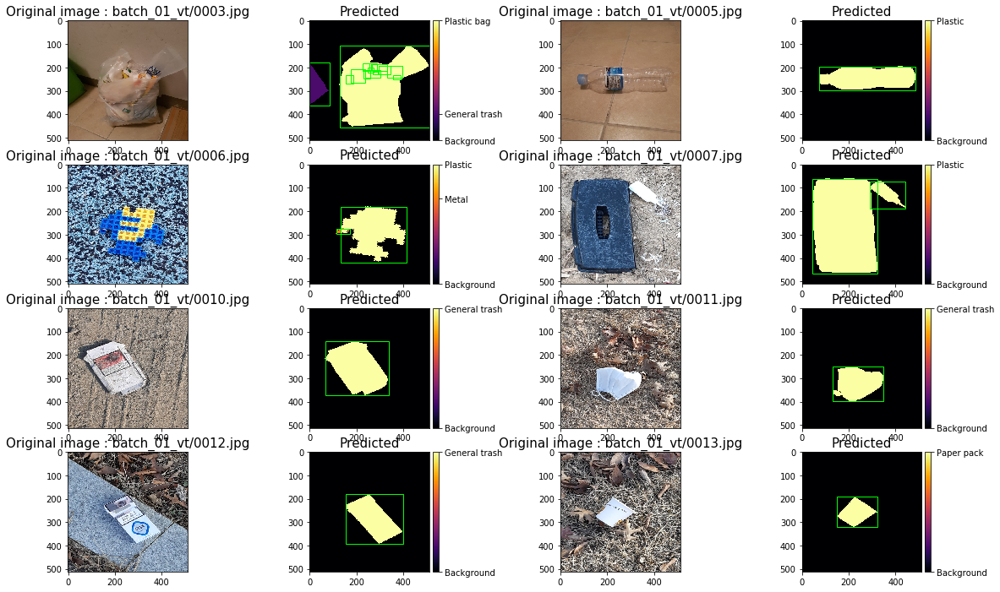

In [6]:
for images, masks, image_infos in data_loader:
    print_image(images, masks, image_infos, batch_size)
    break

## Meta data 분석

In [7]:
img_annotations = defaultdict(int)
for annotation in dataset['annotations']:
    img_annotations[annotation['image_id']] += 1
len(img_annotations)  # equal number of images

2617

In [8]:
object_num = list(img_annotations.values())

max_object_num = max(object_num)
max_object_num_idx = object_num.index(max_object_num)

print(f'max {max_object_num}, index {max_object_num_idx}')

min_object_num = min(object_num)
min_object_num_idx = object_num.index(min_object_num)

print(f'max {min_object_num}, index {min_object_num_idx}')

max 64, index 1583
max 1, index 1


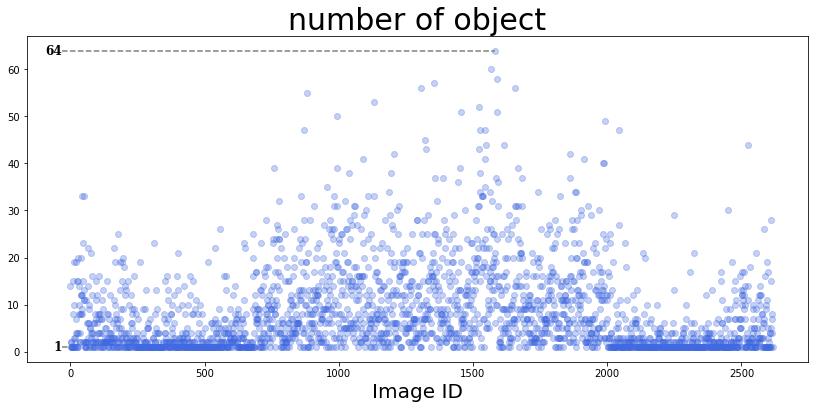

In [9]:
fig = plt.figure(figsize=(14,6))
ax = fig.add_subplot(111)

ax.set_title("number of object", fontsize=30)
ax.set_xlabel("Image ID", fontsize=20)

ax.scatter(range(len(img_annotations)), img_annotations.values(), alpha=0.3, color='royalblue')

# x축과 평행한 선
ax.plot([-30, min_object_num_idx], [min_object_num]*2,
        color='gray', linestyle='--',
        zorder=8)

ax.plot([-30, max_object_num_idx], [max_object_num]*2,
        color='gray', linestyle='--',
        zorder=8)

ax.text(x=-30, y=min_object_num, s=f'{min_object_num:2}',
        fontsize=12,
        fontweight='bold',
        fontfamily='serif',
        color='black',
        va='center', # top, bottom, center
        ha='right', # left, right, center
        rotation='horizontal', # vertical
       )

ax.text(x=-30, y=max_object_num, s=f'{max_object_num:2}',
        fontsize=12,
        fontweight='bold',
        fontfamily='serif',
        color='black',
        va='center', # top, bottom, center
        ha='right', # left, right, center
        rotation='horizontal', # vertical
       )
plt.show()

In [10]:
df = pd.DataFrame(img_annotations, index=['number'])
df = df.T

In [11]:
object_num = list(df.value_counts())

max_object_num = max(object_num)
max_object_num_idx = 1

print(f'max {max_object_num}, index {max_object_num_idx}')

min_object_num = min(object_num)
min_object_num_idx = len(object_num)

print(f'min {min_object_num}, index {min_object_num_idx}')

max 664, index 1
min 1, index 57


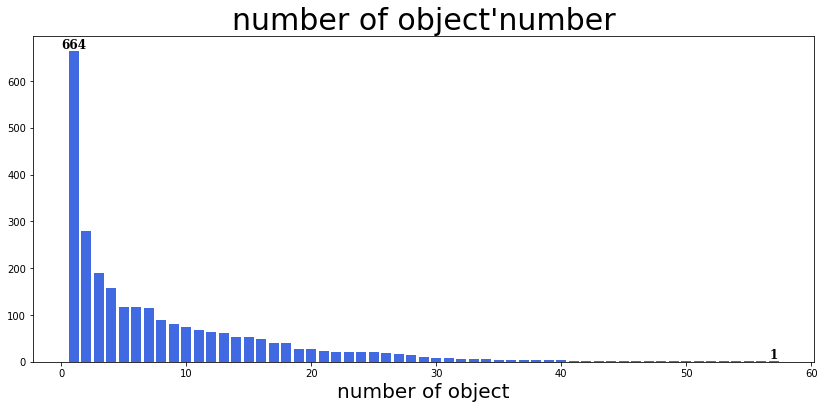

In [13]:
fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(111)

ax.set_title("number of object'number", fontsize=30)
ax.set_xlabel("number of object", fontsize=20)

ax.bar(range(1, len(object_num)+1), object_num, color='royalblue')

ax.text(x=min_object_num_idx, y=min_object_num, s=f'{min_object_num}',
        fontsize=12,
        fontweight='bold',
        fontfamily='serif',
        color='black',
        va='bottom', # top, bottom, center
        ha='center', # left, right, center
        rotation='horizontal', # vertical?
       )

ax.text(x=max_object_num_idx, y=max_object_num, s=f'{max_object_num}',
        fontsize=12,
        fontweight='bold',
        fontfamily='serif',
        color='black',
        va='bottom', # top, bottom, center
        ha='center', # left, right, center
        rotation='horizontal', # vertical?

       )

plt.show()

## Augmenatation 확인

In [14]:
data_path = os.path.join(data_dir, data_file_name)
batch_size = 8

# original
transform = A.Compose([
    ToTensorV2()
])
origin_data_loader = get_loader(data_path, batch_size, transform)

# augmentation 1
transform = A.Compose([
    A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), always_apply=False, p=1),
    ToTensorV2()
])
aug_data_loader1 = get_loader(data_path, batch_size, transform)

# augmentation 2
transform = A.Compose([
    A.CLAHE(clip_limit=4.0, tile_grid_size=(16, 16), always_apply=False, p=1),
    ToTensorV2()
])
aug_data_loader2 = get_loader(data_path, batch_size, transform)

# augmentation 3
transform = A.Compose([
    A.CLAHE(clip_limit=(8.0, 8.0), tile_grid_size=(8, 8), always_apply=False, p=1),
    ToTensorV2()
])
aug_data_loader3 = get_loader(data_path, batch_size, transform)

loading annotations into memory...
Done (t=4.27s)
creating index...
index created!
loading annotations into memory...
Done (t=4.61s)
creating index...
index created!
loading annotations into memory...
Done (t=3.56s)
creating index...
index created!
loading annotations into memory...
Done (t=5.00s)
creating index...
index created!


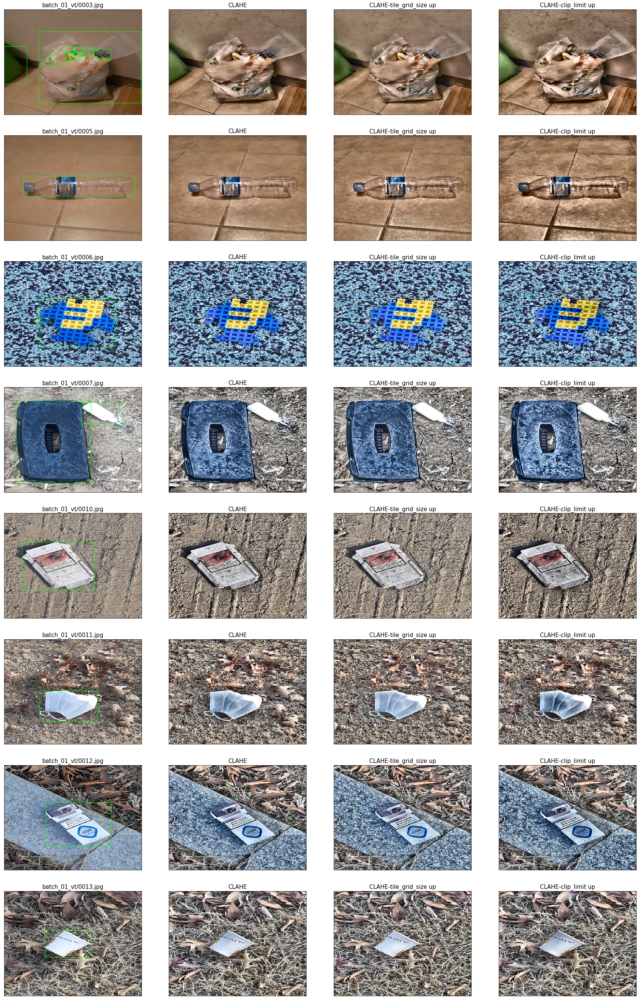

In [15]:
for origin_data, aug_data1, aug_data2, aug_data3 in zip(origin_data_loader, aug_data_loader1, aug_data_loader2, aug_data_loader3):
    ori_images, _, image_infos = origin_data
    aug_images1, _, _ = aug_data1
    aug_images2, _, _ = aug_data2
    aug_images3, _, _ = aug_data3
    
    compare_augmenation(batch_size, ori_images, image_infos, aug_images1, aug_images2, aug_images3, "CLAHE", "CLAHE-tile_grid_size up", "CLAHE-clip_limit up")
    break